In [1]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from tqdm import tqdm_notebook

# Data Cleaning
## 1. Security data

In [2]:
security_reference_data_w_ret1d_1 = pd.read_csv('security_reference_data_w_ret1d_1.csv')
security_reference_data_w_ret1d_2 = pd.read_csv('security_reference_data_w_ret1d_2.csv')
stock = pd.concat([security_reference_data_w_ret1d_1, security_reference_data_w_ret1d_2])
stock['data_date'] = stock['data_date'].apply(lambda x: str(x)).astype('datetime64[ns]')
stock['security_id'] = stock['security_id'].apply(lambda x: str(x))
stock.head()

,data_date,security_id,close_price,volume,group_id,in_trading_universe,ret1d
0,2010-01-04,77901,19.99,72728.0,20102010,N,0.025654
1,2010-01-04,78001,23.77,460537.0,20101010,Y,0.034378
2,2010-01-04,78401,19.64,1847102.0,20104020,Y,0.028272
3,2010-01-04,82901,2.80,219545.0,20301010,N,0.060606
4,2010-01-04,83501,7.90,389291.0,20201060,N,0.085165


In [3]:
print('{} trading days in dataset'.format(len(stock['data_date'].unique())))
print('{} securities in dataset'.format(len(stock['security_id'].unique())))

2013 trading days in dataset
7876 securities in dataset


In [4]:
# securities not in trading universe
not_in_id = stock[stock['in_trading_universe'] == 'N']['security_id'].unique()
stock = stock.loc[~stock['security_id'].isin(not_in_id)]
stock.drop(['in_trading_universe'], axis=1, inplace=True)

In [5]:
by_date = stock.groupby('data_date')

<AxesSubplot:xlabel='data_date'>

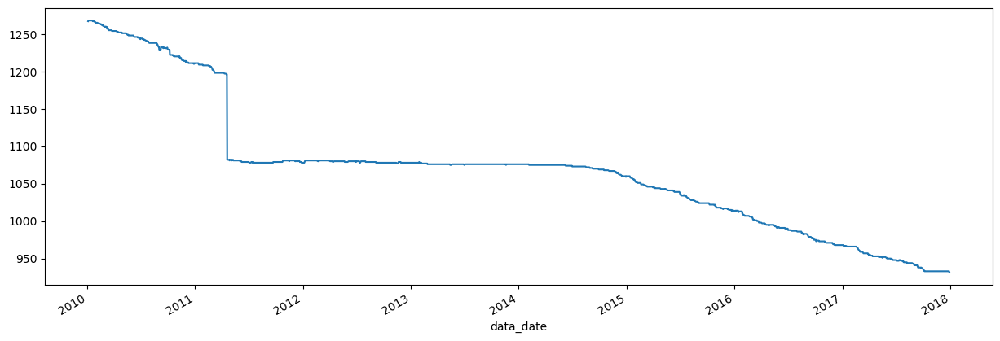

In [6]:
by_date['security_id'].count().plot(figsize=(15, 5))

In [7]:
all_period_id = stock.pivot(index='data_date', columns='security_id', values='ret1d').dropna(axis=1).columns
stock = stock.loc[stock['security_id'].isin(all_period_id)].set_index(['data_date', 'security_id'])
stock

close_price      volume  group_id     ret1d
data_date  security_id                                             
2010-01-04 78401              19.64   1847102.0  20104020  0.028272
           97801              47.57   2361982.0  40301020  0.028541
           102501             13.67   4597591.0  55105010  0.027047
           133001             25.37   1169614.0  40402020 -0.007045
           147701             28.58  29139480.0  50101020  0.019622
...                             ...         ...       ...       ...
2017-12-29 35123401           20.19   2911980.0  40204010 -0.007375
           35433401           85.38    558551.0  25401020 -0.001170
           36167701           40.35  11572310.0  25502020 -0.038141
           1077891701         21.17   2186210.0  25401020 -0.005169
           1113653301         45.15   1112237.0  20202020 -0.003092

[1799622 rows x 4 columns]

In [8]:
print('{} trading days in dataset'.format(len(stock.index.get_level_values(0).unique())))
print('{} securities available'.format(len(stock.index.get_level_values(1).unique())))
print('{} total observations'.format(len(stock)))

2013 trading days in dataset
894 securities available
1799622 total observations


### Confirm security pool

In [9]:
# group level
# stock['group_id'] 转为str
stock['group_id'] = stock['group_id'].apply(lambda x: str(x))
stock['L1'] = stock['group_id'].apply(lambda x: x[:2])
stock['L2'] = stock['group_id'].apply(lambda x: x[2:4])
stock['L3'] = stock['group_id'].apply(lambda x: x[4:6])
stock['L4'] = stock['group_id'].apply(lambda x: x[6:8])
stock

close_price      volume  group_id     ret1d  L1  L2  \
data_date  security_id                                                        
2010-01-04 78401              19.64   1847102.0  20104020  0.028272  20  10   
           97801              47.57   2361982.0  40301020  0.028541  40  30   
           102501             13.67   4597591.0  55105010  0.027047  55  10   
           133001             25.37   1169614.0  40402020 -0.007045  40  40   
           147701             28.58  29139480.0  50101020  0.019622  50  10   
...                             ...         ...       ...       ...  ..  ..   
2017-12-29 35123401           20.19   2911980.0  40204010 -0.007375  40  20   
           35433401           85.38    558551.0  25401020 -0.001170  25  40   
           36167701           40.35  11572310.0  25502020 -0.038141  25  50   
           1077891701         21.17   2186210.0  25401020 -0.005169  25  40   
           1113653301         45.15   1112237.0  20202020 -0.003092  20  20   

                        L3  L4  
data_date  security_id          
2010-01-04 78401        40  20  
           97801        10  20  
           102501       50  10  
           133001       20  20  
           147701       10  20  
...                     ..  ..  
2017-12-29 35123401     40  10  
           35433401     10  20  
           36167701     20  20  
           1077891701   10  20  
           1113653301   20  20  

[1799622 rows x 8 columns]

## 2. Risk factor

In [10]:
risk_factors_1 = pd.read_csv('risk_factors_1.csv')
risk_factors_2 = pd.read_csv('risk_factors_2.csv')
risk_factors = pd.concat([risk_factors_1, risk_factors_2])
risk_factors['data_date'] = risk_factors['data_date'].apply(lambda x: str(x)).astype('datetime64[ns]')
risk_factors['security_id'] = risk_factors['security_id'].apply(lambda x: str(x))
risk_factors.set_index(['data_date', 'security_id'], inplace=True)
risk_factors

rf1    rf2    rf3    rf4    rf5    rf6
data_date  security_id                                          
2010-01-04 5311701      0.284 -0.500  1.789  2.962 -0.435 -0.314
           3780701      1.890 -1.330 -0.208  0.775 -0.803 -0.576
           2297301      0.012  0.217  0.285 -0.151  0.883  0.127
           83501        1.185  1.195  2.677 -1.485 -1.236 -1.341
           4159901     -0.335 -2.917  2.548  1.691  0.394 -2.290
...                       ...    ...    ...    ...    ...    ...
2017-12-29 1114827901   0.322  0.118 -1.623  0.716 -0.141  0.172
           1107343201  -0.690 -0.662 -2.213  0.364 -0.186 -0.953
           1118042001   0.322  0.081  2.433  0.872 -0.147  0.193
           1117917701  -0.466 -1.404 -2.107  1.016 -1.579 -1.346
           1115398701  -0.062 -0.123 -2.239  0.123 -0.088 -0.414

[8800015 rows x 6 columns]

### Data merge

In [11]:
data  = pd.merge(stock, risk_factors, left_index=True, right_index=True, how='left')
# data.insert(0, 'next_ret', data.unstack(level=1)['ret1d'].shift(-1).stack())
data = data.dropna()
data

close_price      volume  group_id     ret1d  L1  L2  \
data_date  security_id                                                        
2010-01-04 78401              19.64   1847102.0  20104020  0.028272  20  10   
           97801              47.57   2361982.0  40301020  0.028541  40  30   
           102501             13.67   4597591.0  55105010  0.027047  55  10   
           133001             25.37   1169614.0  40402020 -0.007045  40  40   
           147701             28.58  29139480.0  50101020  0.019622  50  10   
...                             ...         ...       ...       ...  ..  ..   
2017-12-29 35123401           20.19   2911980.0  40204010 -0.007375  40  20   
           35433401           85.38    558551.0  25401020 -0.001170  25  40   
           36167701           40.35  11572310.0  25502020 -0.038141  25  50   
           1077891701         21.17   2186210.0  25401020 -0.005169  25  40   
           1113653301         45.15   1112237.0  20202020 -0.003092  20  20   

                        L3  L4    rf1    rf2    rf3    rf4    rf5    rf6  
data_date  security_id                                                    
2010-01-04 78401        40  20  0.776 -0.371 -0.501 -0.385 -0.099  0.070  
           97801        10  20  2.081  0.267 -0.449 -0.216  0.041  0.792  
           102501       50  10  1.345 -0.098 -0.350  0.224  0.441  0.419  
           133001       20  20  2.668 -0.356 -1.031  0.545 -1.560 -1.302  
           147701       10  20 -0.958 -0.321  0.011  0.331 -0.182  0.415  
...                     ..  ..    ...    ...    ...    ...    ...    ...  
2017-12-29 35123401     40  10 -1.081 -0.434 -0.363  2.213 -2.196  2.113  
           35433401     10  20 -0.589 -0.161 -0.244 -0.271  0.150  0.388  
           36167701     20  20 -0.498 -0.453  0.677 -0.435 -0.174  0.331  
           1077891701   10  20 -0.152 -2.182  1.593  1.067  0.722  1.615  
           1113653301   20  20 -0.317 -0.349 -0.251  0.283 -0.150 -0.212  

[1799622 rows x 14 columns]

In [12]:
raw_data = data.reset_index()

# DATA ANALYSIS
## 1. Group analysis

when in a long position:

In [13]:
print('{} groups in dataset'.format(len(raw_data['group_id'].unique())))
print('{} groups in L1'.format(len(raw_data['L1'].unique())))
print('{} groups in L2'.format(len(raw_data['L2'].unique())))
print('{} groups in L3'.format(len(raw_data['L3'].unique())))
print('{} groups in L4'.format(len(raw_data['L4'].unique())))

165 groups in dataset
11 groups in L1
5 groups in L2
7 groups in L3
12 groups in L4


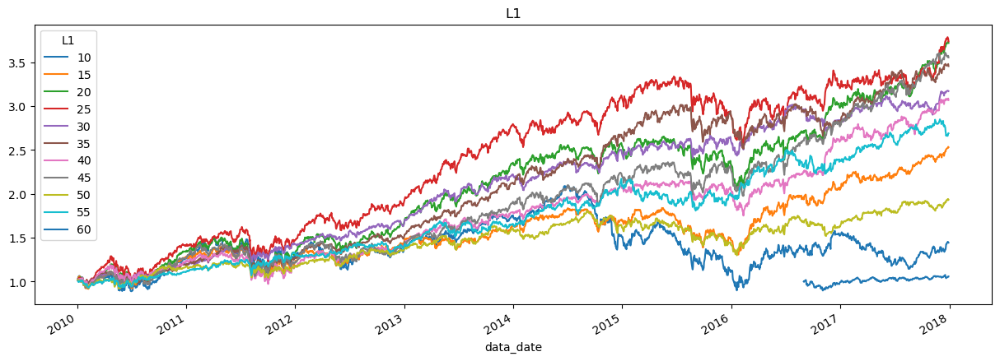

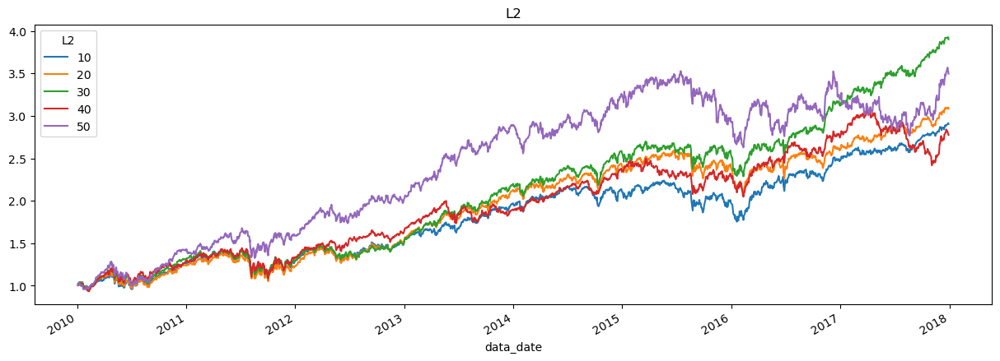

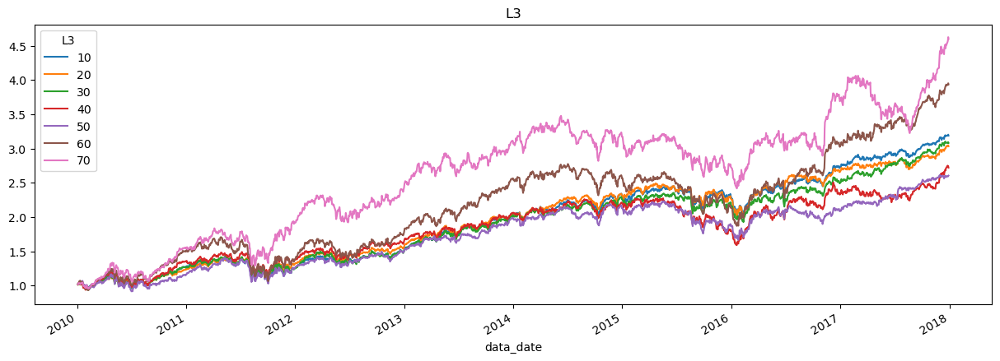

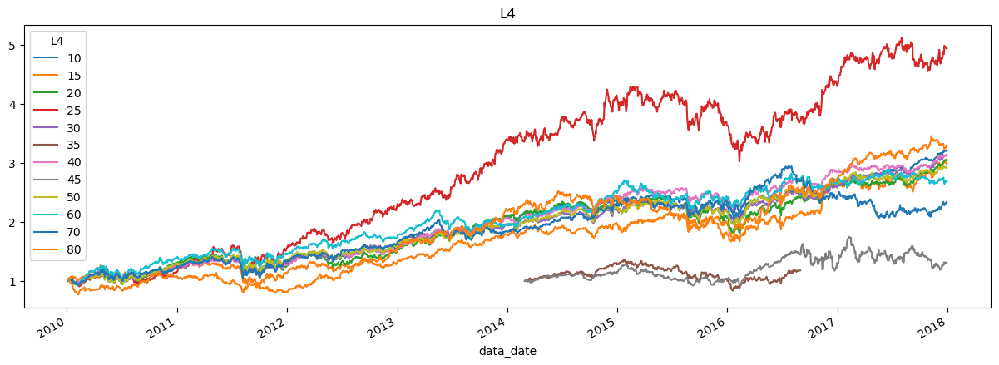

In [14]:
for L in ['L1', 'L2', 'L3', 'L4']:
    (raw_data.pivot_table(index='data_date', columns=L, values='ret1d', aggfunc='mean') + 1).cumprod().plot(figsize=(15, 5), title=L);

In [15]:
L1_val = raw_data['L1'].unique() 
n = len(L1_val)
# for each group, plot: (raw_data[raw_data['L1']=='25'].pivot_table(index='data_date', columns='L2', values='ret1d', aggfunc='mean') + 1).cumprod().plot(figsize=(15, 5), title='L2');
fig, axes = plt.subplots(n, 1, figsize=(15, 7*n), dpi=300)
for i, L1 in enumerate(L1_val):
    (raw_data[raw_data['L1']==L1].pivot_table(index='data_date', columns='L2', values='ret1d', aggfunc='mean') + 1).cumprod().plot(ax=axes[i], title='L1: {}'.format(L1));

when in short position

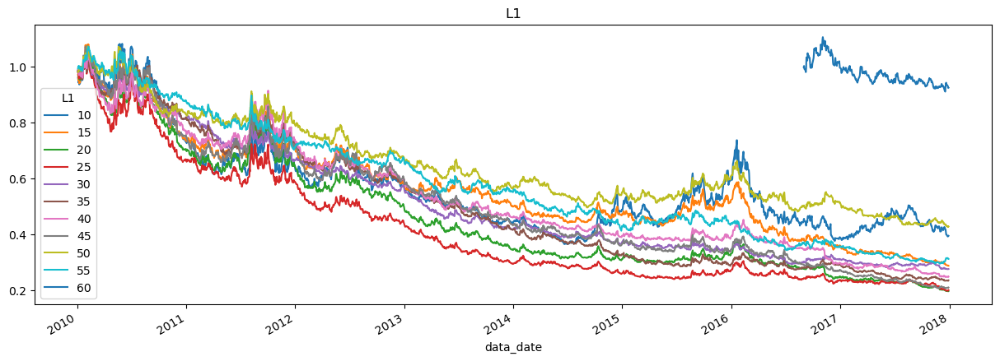

In [16]:
(-1 * raw_data.pivot_table(index='data_date', columns='L1', values='ret1d', aggfunc='mean') + 1).cumprod().plot(figsize=(15, 5), title='L1');

**CONCLUSION:** ENTER LONG POSTION ONLY IN GROUP 25(L1)

## 2. Volume analysis

  0%|          | 0/5 [00:00<?, ?it/s]

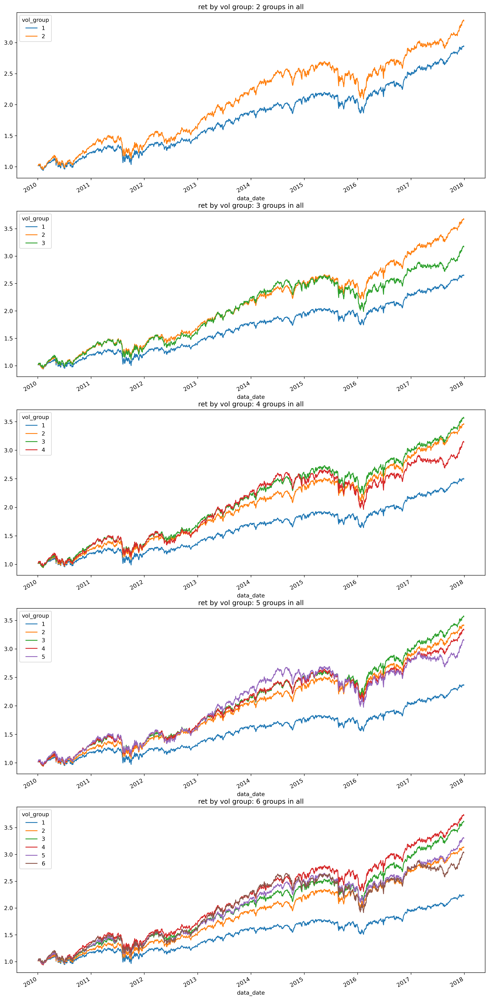

In [17]:
vol = raw_data.pivot_table(index='data_date', columns='security_id', values='volume')
# 每天给股票按volumne分组, 1-5, 5最大，1最小，列名位 vol_group
# vol_group = vol.apply(lambda row: pd.qcut(row, 5, labels=[1, 2, 3, 4, 5], duplicates='drop')[::-1], axis=1).stack().rename('vol_group')
# ret_by_vol_group = pd.concat([vol_group, data['ret1d']], axis=1).reset_index()
# (ret_by_vol_group.pivot_table(index='data_date', columns='vol_group', values='ret1d', aggfunc='mean') + 1).cumprod().plot(figsize=(15, 5), title='ret by vol group');

# subplot, 把分组数从2-6组(一共分2，3，4，5，6组)，分别重复上面的操作，画图
fig, axes = plt.subplots(5, 1, figsize=(15, 7*5), dpi=300)
for i in tqdm_notebook(range(2, 7)):
    vol_group = vol.apply(lambda row: pd.qcut(row, i, labels=range(1, i+1), duplicates='drop'), axis=1).stack().rename('vol_group')
    ret_by_vol_group = pd.concat([vol_group, data['ret1d']], axis=1).reset_index()
    (ret_by_vol_group.pivot_table(index='data_date', columns='vol_group', values='ret1d', aggfunc='mean') + 1).cumprod().plot(ax=axes[i-2], title='ret by vol group: {} groups in all'.format(i));


**VOLUMNE:** ONLY TRADE SECURITIES WHOSE VOL IN TOP 80% 

## 3. Correlation with price(maybe lower price could be easier to go up)

  0%|          | 0/5 [00:00<?, ?it/s]

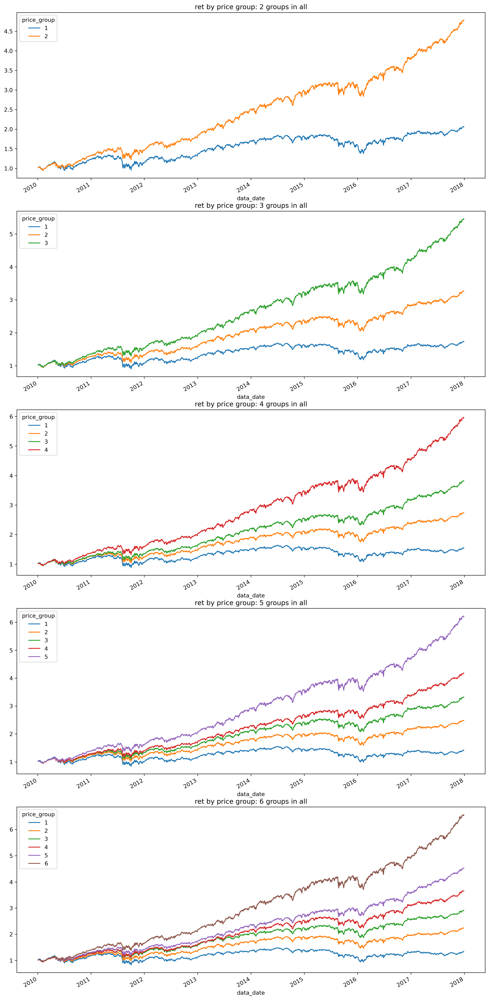

In [18]:
pri = raw_data.pivot_table(index='data_date', columns='security_id', values='close_price')
# subplot, 把分组数从2-6组(一共分2，3，4，5，6组)，分别重复上面的操作，画图
fig, axes = plt.subplots(5, 1, figsize=(15, 7*5), dpi=300)
for i in tqdm_notebook(range(2, 7)):
    pri_group = pri.apply(lambda row: pd.qcut(row, i, labels=range(1, i+1), duplicates='drop'), axis=1).stack().rename('price_group')
    ret_by_pri_group = pd.concat([pri_group, data['ret1d']], axis=1).reset_index()
    (ret_by_pri_group.pivot_table(index='data_date', columns='price_group', values='ret1d', aggfunc='mean') + 1).cumprod().plot(ax=axes[i-2], title='ret by price group: {} groups in all'.format(i));


**PRICE:** ONLY TRADE SECURITIES WHOSE PRICE AMOUNT IN TOP 20%
            , TAIL 20% COULD BE SHORT



## 4. Risk factor analysis

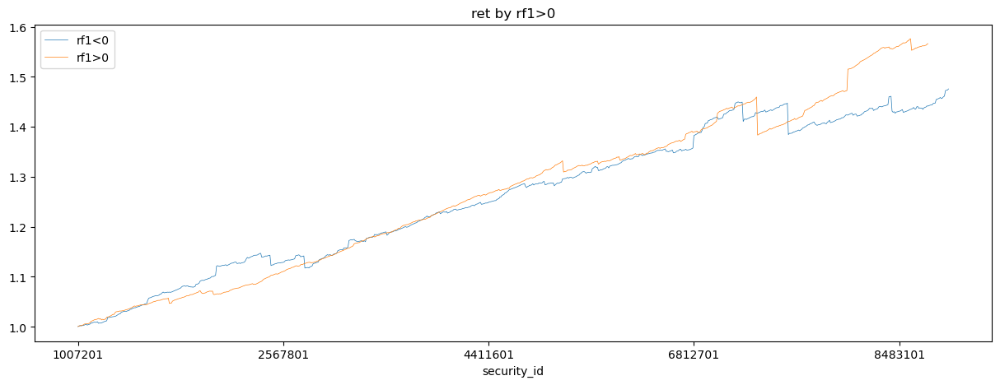

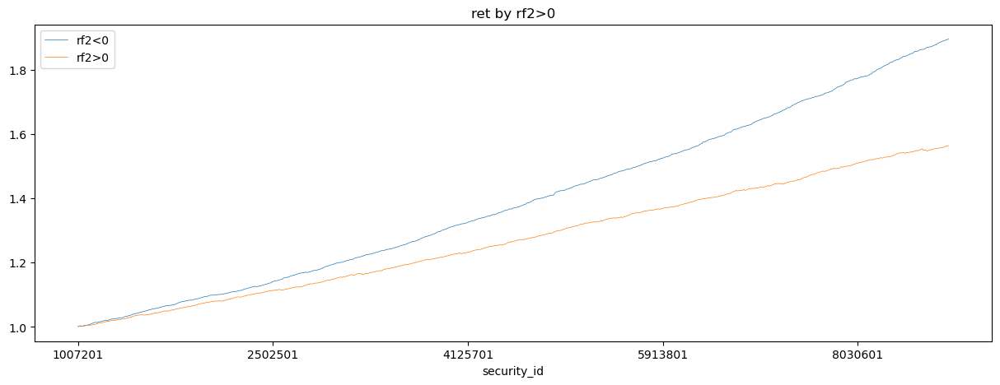

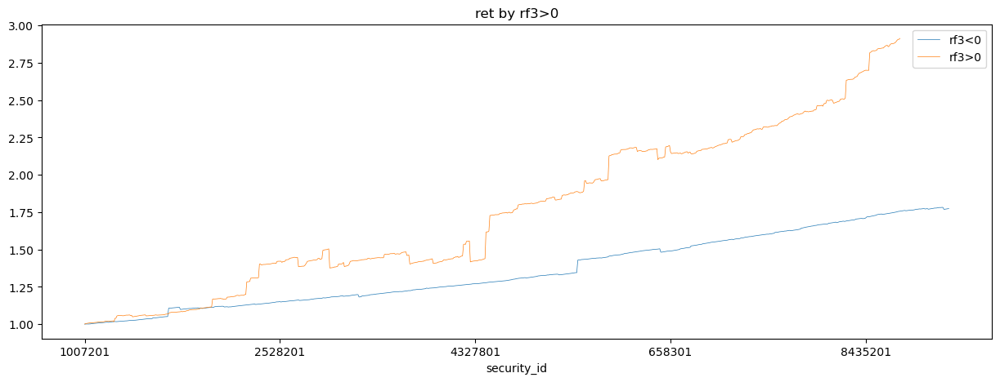

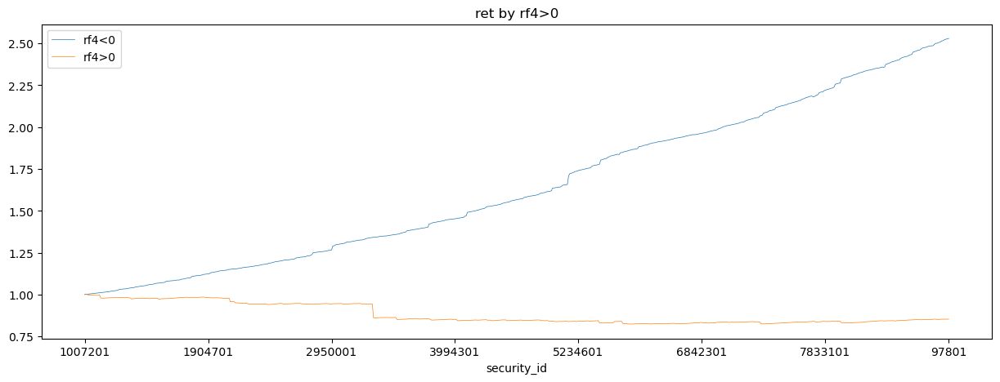

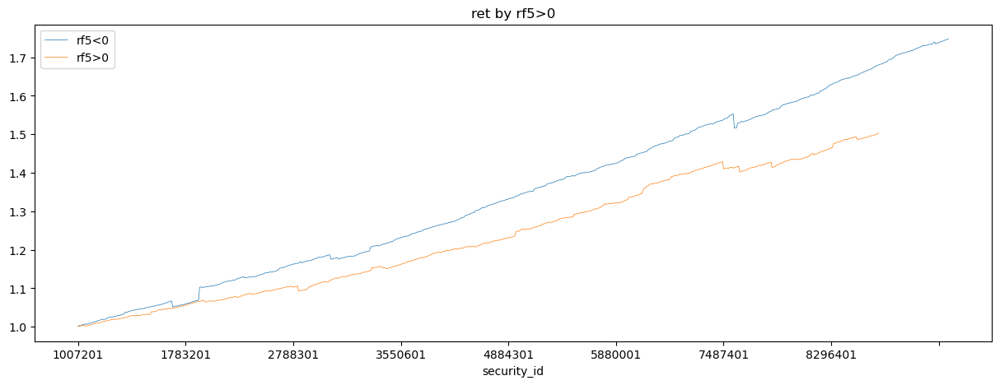

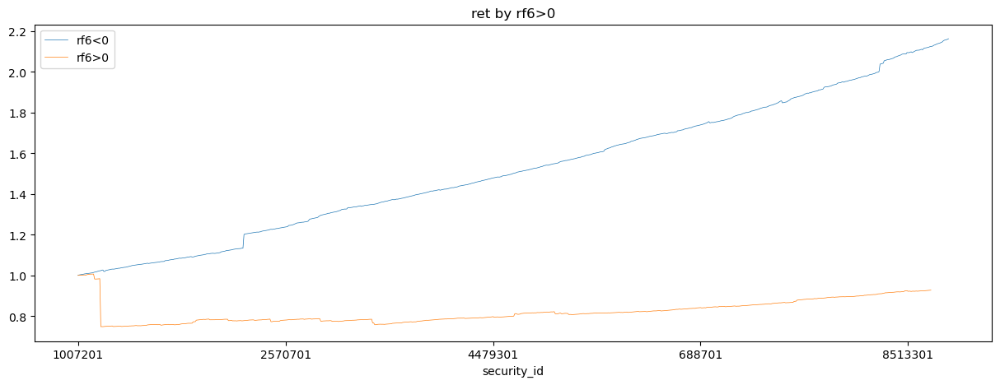

In [19]:
# select rf1,2,5
for rf in ['rf1', 'rf2', 'rf3', 'rf4', 'rf5', 'rf6']:
    plt.figure()
    (raw_data[raw_data[rf]<0].pivot_table(index='data_date', columns='security_id', values='ret1d').mean()+1).cumprod().plot(figsize=(15, 5), linewidth=0.5, title='ret by {}<0'.format(rf));
    (raw_data[raw_data[rf]>0].pivot_table(index='data_date', columns='security_id', values='ret1d').mean()+1).cumprod().plot(figsize=(15, 5), linewidth=0.5, title='ret by {}>0'.format(rf));
    plt.legend(['{}<0'.format(rf), '{}>0'.format(rf)])
    plt.show()

Mainly focus on rf4

  0%|          | 0/5 [00:00<?, ?it/s]

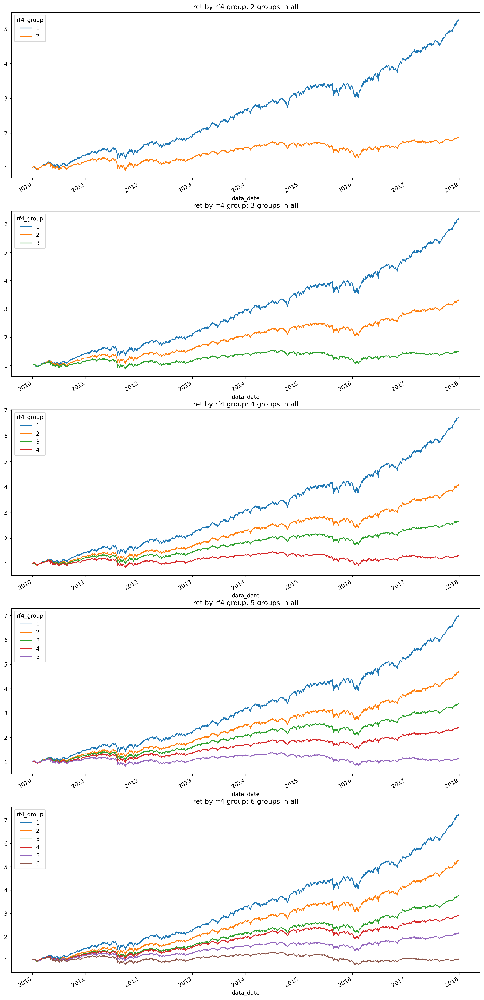

In [20]:
rf4 = raw_data.pivot_table(index='data_date', columns='security_id', values='rf4')
# subplot, 把分组数从2-6组(一共分2，3，4，5，6组)，分别重复上面的操作，画图
fig, axes = plt.subplots(5, 1, figsize=(15, 7*5), dpi=300)
for i in tqdm_notebook(range(2, 7)):
    rf4_group = rf4.apply(lambda row: pd.qcut(row, i, labels=range(1, i+1), duplicates='drop')[::-1], axis=1).stack().rename('rf4_group')
    ret_by_rf4_group = pd.concat([rf4_group, data['ret1d']], axis=1).reset_index()
    (ret_by_rf4_group.pivot_table(index='data_date', columns='rf4_group', values='ret1d', aggfunc='mean') + 1).cumprod().plot(ax=axes[i-2], title='ret by rf4 group: {} groups in all'.format(i));


**RISK FACTOR** rf4: LONG TAIL 20%, SHORT TOP 20%

# STRATEGY

***
---
**STRATEGY**  
    1. RISK: FACTOR rf4: LONG TAIL 20%, SHORT TOP 20%  
    2. PRICE: ONLY TRADE SECURITIES WHOSE PRICE AMOUNT IN TOP 20% , TAIL 20% COULD BE SHORT  
    3. VOLUMNE: ONLY TRADE SECURITIES WHOSE VOL IN TOP 80%   
    4. GROUP: ENTER LONG POSTION ONLY IN GROUP 25(L1)  

***
---

In [21]:
# unstack ret1d
ret1d = data.unstack(level=1)['ret1d']

In [22]:
def stg_plot(long_con, short_con):
    data['long'] = long_con
    data['short'] =  short_con
    data[['long', 'short']] = data[['long', 'short']].unstack(level='security_id').shift(1).stack(level='security_id').fillna(True)

    # data满足以上条件的数据
    r_l = data[data['long']==True]['ret1d'].unstack().mean(axis=1)
    r_s = data[data['short']==True]['ret1d'].unstack().mean(axis=1)
    r = r_l - r_s - 0.02/100
    r_b = ret1d.mean(axis=1)
    # create a cost shape like r_b
    cost = pd.Series(-0.02/100, index=r_b.index)
    cost.iloc[0] = 0
    # initial capital = $0
    # benchmark: buy $1 hold for 1 day
    df = pd.DataFrame({'strategy': r.cumsum(), 'cost': cost.cumsum(), 'no cost ret': (r - cost).cumsum(), 'benchmark': r_b.cumsum()}).fillna(method='ffill').fillna(0)
    df.plot(figsize=(15, 5))
    plt.legend()
    plt.grid()
    plt.title('Arbitrage Strategy Performance')
    plt.show()
    return df

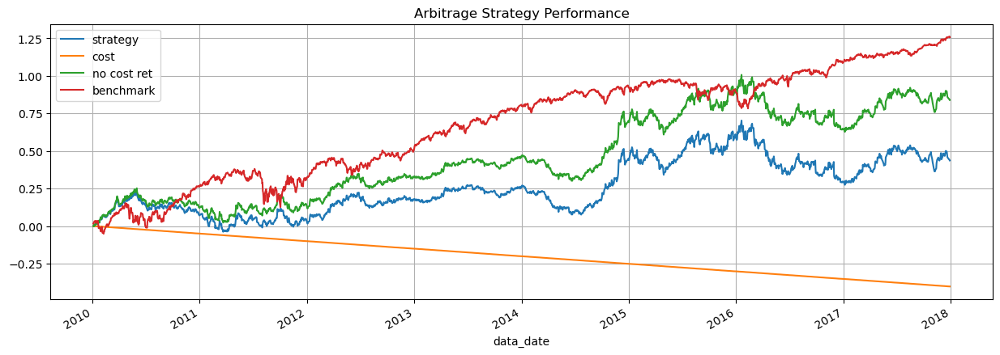

,strategy,cost,no cost ret,benchmark
data_date,,,,
2010-01-04,0.000000,0.0000,0.000000,0.016673
2010-01-05,0.002762,-0.0002,0.002962,0.020531
2010-01-06,-0.002587,-0.0004,-0.002187,0.024270
2010-01-07,0.011109,-0.0006,0.011709,0.028512
2010-01-08,0.001680,-0.0008,0.002480,0.032519
...,...,...,...,...
2017-12-22,0.455360,-0.4016,0.856960,1.257014
2017-12-26,0.444810,-0.4018,0.846610,1.259384
2017-12-27,0.444193,-0.4020,0.846193,1.259040


In [23]:
# strategy 1: group arbitrage, long group 25, short group 10
stg_plot(data['L1'] == '25', data['L1'] == '10')

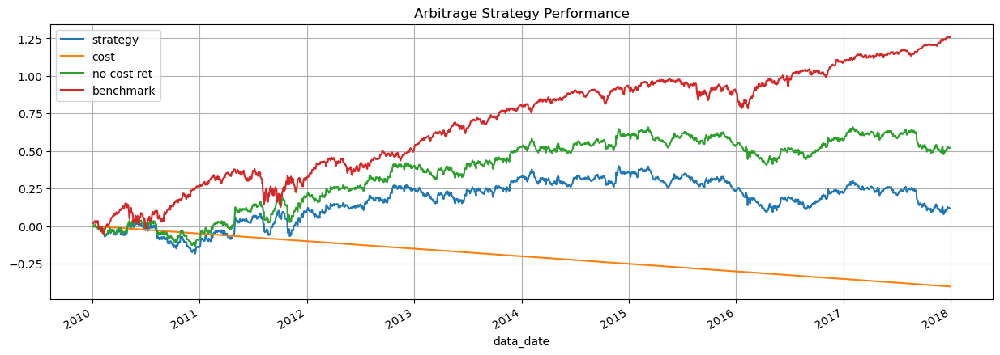

,strategy,cost,no cost ret,benchmark
data_date,,,,
2010-01-04,0.000000,0.0000,0.000000,0.016673
2010-01-05,0.002578,-0.0002,0.002778,0.020531
2010-01-06,-0.005062,-0.0004,-0.004662,0.024270
2010-01-07,-0.001263,-0.0006,-0.000663,0.028512
2010-01-08,-0.001501,-0.0008,-0.000701,0.032519
...,...,...,...,...
2017-12-22,0.122364,-0.4016,0.523964,1.257014
2017-12-26,0.121051,-0.4018,0.522851,1.259384
2017-12-27,0.116590,-0.4020,0.518590,1.259040


In [24]:
# strategy 2: group arbitrage, long group 25, short group 10 (L4)
stg_plot(data['L4'] == '25', data['L4'] == '10')

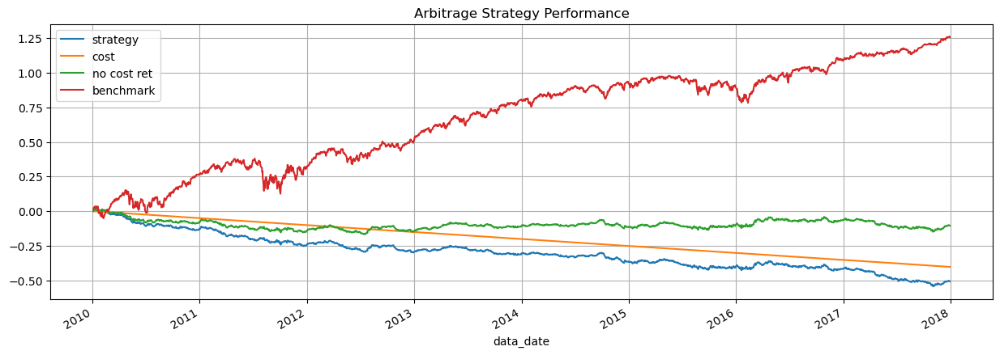

,strategy,cost,no cost ret,benchmark
data_date,,,,
2010-01-04,0.000000,0.0000,0.000000,0.016673
2010-01-05,0.009240,-0.0002,0.009440,0.020531
2010-01-06,0.008245,-0.0004,0.008645,0.024270
2010-01-07,0.013150,-0.0006,0.013750,0.028512
2010-01-08,0.010769,-0.0008,0.011569,0.032519
...,...,...,...,...
2017-12-22,-0.504698,-0.4016,-0.103098,1.257014
2017-12-26,-0.502091,-0.4018,-0.100291,1.259384
2017-12-27,-0.505659,-0.4020,-0.103659,1.259040


In [25]:
# strategy 3: volume strategy
topvol = data['volume'].unstack()
data['top20vol'] = topvol.gt(topvol.quantile(0.8, axis=1), axis=0).stack().astype(int)
data['tail20vol'] = topvol.le(topvol.quantile(0.2, axis=1), axis=0).stack().astype(int)

stg_plot(data['top20vol'] == 1, data['tail20vol'] == 1)

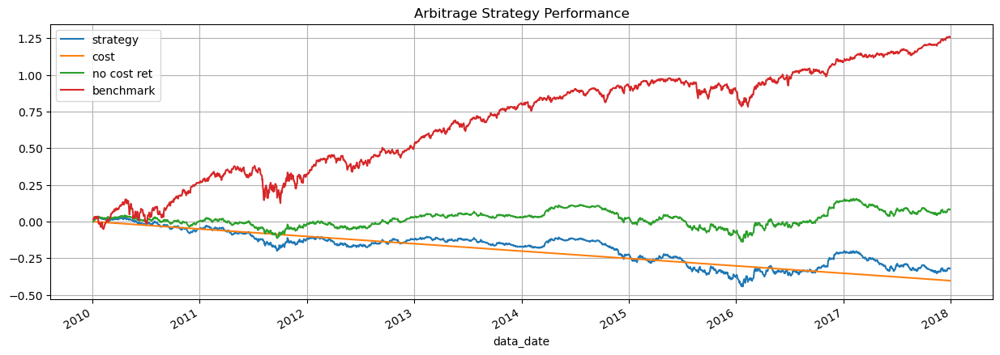

,strategy,cost,no cost ret,benchmark
data_date,,,,
2010-01-04,0.000000,0.0000,0.000000,0.016673
2010-01-05,0.002688,-0.0002,0.002888,0.020531
2010-01-06,0.004716,-0.0004,0.005116,0.024270
2010-01-07,0.013356,-0.0006,0.013956,0.028512
2010-01-08,0.013885,-0.0008,0.014685,0.032519
...,...,...,...,...
2017-12-22,-0.321554,-0.4016,0.080046,1.257014
2017-12-26,-0.315659,-0.4018,0.086141,1.259384
2017-12-27,-0.320086,-0.4020,0.081914,1.259040


In [26]:
# strategy 4: rf4 strategy
rf4 = data['rf4'].unstack()
data['top20rf4'] = rf4.gt(rf4.quantile(0.8, axis=1), axis=0).stack().astype(int)
data['tail20rf4'] = rf4.le(rf4.quantile(0.2, axis=1), axis=0).stack().astype(int)

stg_plot(data['top20rf4'] == 1, data['tail20rf4'] == 1)

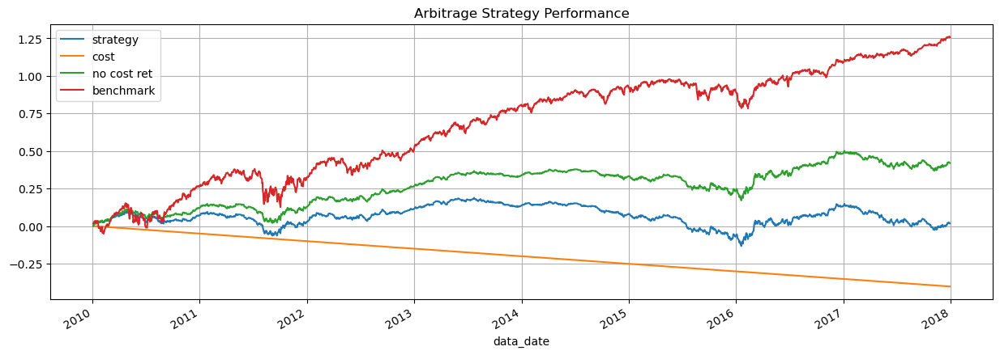

,strategy,cost,no cost ret,benchmark
data_date,,,,
2010-01-04,0.000000,0.0000,0.000000,0.016673
2010-01-05,0.006568,-0.0002,0.006768,0.020531
2010-01-06,0.008231,-0.0004,0.008631,0.024270
2010-01-07,0.019892,-0.0006,0.020492,0.028512
2010-01-08,0.018800,-0.0008,0.019600,0.032519
...,...,...,...,...
2017-12-22,0.018949,-0.4016,0.420549,1.257014
2017-12-26,0.024420,-0.4018,0.426220,1.259384
2017-12-27,0.017869,-0.4020,0.419869,1.259040


In [27]:
# strategy 5: price strategy
price = data['close_price'].unstack()
data['top30price'] = price.gt(price.quantile(0.8, axis=1), axis=0).stack().astype(int)
data['tail30price'] = price.le(price.quantile(0.2, axis=1), axis=0).stack().astype(int)
price_long_condition = data['tail30price']==1
price_short_condition = data['top30price']==1 

stg_plot(price_long_condition, price_short_condition)

#### We choose to use the strategy 1, which has better performance and relatively lower drowndown

# Statistics calculation of risk management

### Including return, volatility, drawdown (magnitude and length), Sharpe ratio, $%$ of positive days, turnover and etc

In [28]:
import scipy.integrate
import scipy.stats

In [29]:
def omega(risk_free, degree_of_freedom, maximum, minimum):
    y = scipy.integrate.quad(lambda g: 1-scipy.stats.t.cdf(g, degree_of_freedom), risk_free, maximum)
    x = scipy.integrate.quad(lambda g: scipy.stats.t.cdf(g, degree_of_freedom), minimum, risk_free)
    z = (y[0])/(x[0])
    return z

In [30]:
def sortino(risk_free, degree_of_freedom, growth_rate, minimum):
    v = np.sqrt(np.abs(scipy.integrate.quad(lambda g: ((risk_free - g)**2) * scipy.stats.t.pdf(g, degree_of_freedom), risk_free, minimum)))
    s = (growth_rate - risk_free)/v[0]
    return s

In [31]:
def stg_stats(long_con, short_con):
    data['long'] = long_con
    data['short'] =  short_con
    data[['long', 'short']] = data[['long', 'short']].unstack(level='security_id').shift(1).stack(level='security_id').fillna(True)

    r_l = data[data['long']==True]['ret1d'].unstack().mean(axis=1)
    r_s = data[data['short']==True]['ret1d'].unstack().mean(axis=1)
    r = r_l - r_s - 0.02/100
    r_b = ret1d.mean(axis=1)

    df = pd.DataFrame({'Daily Return': r, 'strategy': r.cumsum(), 'benchmark': r_b.cumsum()}).fillna(method='ffill').fillna(0)
    
    # get the min and max of return
    maximum = np.max(df['Daily Return'])
    minimum = np.min(df['Daily Return'])

    # growth_rate denotes the average growth rate of portfolio
    growth_rate = df['Daily Return'].mean()

    # calculating the standard deviation
    std = float(df['Daily Return'].std())

    # calculating the benchmark
    return_of_benchmark = df['benchmark'].iloc[-1]

    # calculating the rate of benchmark
    rate_of_benchmark = df['benchmark'].pct_change().mean()

    stats = pd.DataFrame([0])

    # backtest statistics
    stats['CAGR'] = stats['return'] = stats['volatility'] = float(0)
    stats['CAGR'][0] = growth_rate
    stats['return'][0] = df['strategy'].iloc[-1]
    stats['volatility'][0] = std
    stats['benchmark return'] = return_of_benchmark

    stats['maximum drawdown'] = (df['strategy'] / df['strategy'].max() - 1).min()

    # calculating the % of positive days
    stats['positive days'] = float(0)
    stats['positive days'][0] = float(df[df['Daily Return'] > 0]['Daily Return'].count()) / float(df['Daily Return'].count())

    # calculating the turnover
    stats['turnover'] = float(0)
    stats['turnover'][0] = 1

    # calculating the Sharpe ratio
    stats['sharpe ratio'] = (growth_rate - rate_of_benchmark) / std
    stats['calmar ratio'] = growth_rate / stats['maximum drawdown']
    stats['omega ratio'] = omega(rate_of_benchmark, len(df), maximum, minimum)
    stats['sortino ratio'] = sortino(rate_of_benchmark,len(df), growth_rate, minimum)
    
    return stats

In [32]:
stg1 = stg_stats(data['L1'] == '25', data['L1'] == '10')
stg1

,0,CAGR,return,volatility,benchmark return,maximum drawdown,positive days,turnover,sharpe ratio,calmar ratio,omega ratio,sortino ratio
0,0,0.000217,0.43662,0.012092,1.25742,-1.054596,0.521113,1.0,-0.613103,-0.000206,0.830454,-0.637698


# The impact of trading cost and rebalance frequency

In [33]:
def stg_stats_no_cost(long_con, short_con):
    data['long'] = long_con
    data['short'] =  short_con
    data[['long', 'short']] = data[['long', 'short']].unstack(level='security_id').shift(1).stack(level='security_id').fillna(True)

    r_l = data[data['long']==True]['ret1d'].unstack().mean(axis=1)
    r_s = data[data['short']==True]['ret1d'].unstack().mean(axis=1)
    r = r_l - r_s
    r_b = ret1d.mean(axis=1)

    df = pd.DataFrame({'Daily Return': r, 'no cost ret': r.cumsum(), 'benchmark': r_b.cumsum()}).fillna(method='ffill').fillna(0)
    
    # get the min and max of return
    maximum = np.max(df['Daily Return'])
    minimum = np.min(df['Daily Return'])

    # growth_rate denotes the average growth rate of portfolio
    growth_rate = df['Daily Return'].mean()

    # calculating the standard deviation
    std = float(df['Daily Return'].std())

    # calculating the benchmark
    return_of_benchmark = df['benchmark'].iloc[-1]

    # calculating the rate of benchmark
    rate_of_benchmark = df['benchmark'].pct_change().mean()

    stats = pd.DataFrame([0])

    # backtest statistics
    stats['CAGR'] = stats['return'] = stats['volatility'] = float(0)
    stats['CAGR'][0] = growth_rate
    stats['return'][0] = df['no cost ret'].iloc[-1]
    stats['volatility'][0] = std
    stats['benchmark return'] = return_of_benchmark

    stats['maximum drawdown'] = (df['no cost ret'] / df['no cost ret'].max() - 1).min()

    # calculating the % of positive days
    stats['positive days'] = float(0)
    stats['positive days'][0] = float(df[df['Daily Return'] > 0]['Daily Return'].count()) / float(df['Daily Return'].count())

    # calculating the turnover
    stats['turnover'] = float(0)
    stats['turnover'][0] = 1

    # calculating the Sharpe ratio
    stats['sharpe ratio'] = (growth_rate - rate_of_benchmark) / std
    stats['calmar ratio'] = growth_rate / stats['maximum drawdown']
    stats['omega ratio'] = omega(rate_of_benchmark, len(df), maximum, minimum)
    stats['sortino ratio'] = sortino(rate_of_benchmark,len(df), growth_rate, minimum)
    
    return stats

In [34]:
stg1_no_cost = stg_stats_no_cost(data['L1'] == '25', data['L1'] == '10')
stg1_no_cost

,0,CAGR,return,volatility,benchmark return,maximum drawdown,positive days,turnover,sharpe ratio,calmar ratio,omega ratio,sortino ratio
0,0,0.000417,0.83902,0.012092,1.25742,-1.002172,0.528068,1.0,-0.596571,-0.000416,0.83395,-0.622354


In [35]:
stg1_gap = stg1 - stg1_no_cost
stg1_gap

,0,CAGR,return,volatility,benchmark return,maximum drawdown,positive days,turnover,sharpe ratio,calmar ratio,omega ratio,sortino ratio
0,0,-0.0002,-0.4024,-2.604664e-09,0.0,-0.052424,-0.006955,0.0,-0.016532,0.00021,-0.003496,-0.015344
